# Spiral classification

The project builds on https://github.com/Atcold/NYU-DLSP21/blob/master/04-spiral_classification.ipynb.

Model architecture:
![alt text](fin.png "Architecture")

In [ ]:
import torch
from torch import nn, optim
from math import pi as π

In [ ]:
import matplotlib as mpl
import numpy as np
import torch
from IPython.display import clear_output
from matplotlib import pyplot as plt
from scipy.stats import gaussian_kde

def set_default(figsize=(10, 10), dpi=100):
    plt.style.use(['dark_background', 'bmh'])
    plt.rc('axes', facecolor='k')
    plt.rc('figure', facecolor='k')
    plt.rc('figure', figsize=figsize, dpi=dpi)

def acc(l, y):
    score, predicted = torch.max(l, 1)
    return (y == predicted).sum().float() / len(y)

set_default()

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cpu


## Create the data

In [ ]:
seed = 12345
torch.manual_seed(seed)
N = 1000  # num_samples_per_class
n = 2     # input dimensions
K = 5     # num_classes
d = 100   # num_hidden_units

In [ ]:
def plot_data(X, y, d=0, auto=False, zoom=1, title='Training data (x, y)'):
    X = X.cpu()
    y = y.cpu()
    s = plt.scatter(X.numpy()[:, 0], X.numpy()[:, 1], c=y, s=20, cmap=plt.cm.Spectral)
    plt.axis('square')
    plt.axis(np.array((-1.1, 1.1, -1.1, 1.1)) * zoom)
    if auto is True: plt.axis('equal')
    plt.axis('off')

    _m, _c = 0, '.35'
    plt.axvline(0, ymin=_m, color=_c, lw=1)
    plt.axhline(0, xmin=_m, color=_c, lw=1)
    plt.title(title)
    return s

In [ ]:
# Generate spirals

t = torch.linspace(0, 1, N)
a = 0.8 * t + 0.2  # amplitude 0.2 → 1.0
X = list()
y = list()
for k in range(K):
    θ = (2 * t + k) * 2 * π / K + 0.2 * torch.randn(N)
    X.append(torch.stack((a * θ.sin(), a * θ.cos()), dim=1))
    y.append(torch.zeros(N, dtype=torch.long).fill_(k))
X = torch.cat(X)
y = torch.cat(y)

print("Shapes:")
print("X:", tuple(X.size()))
print("y:", tuple(y.size()))

Shapes:
X: (5000, 2)
y: (5000,)


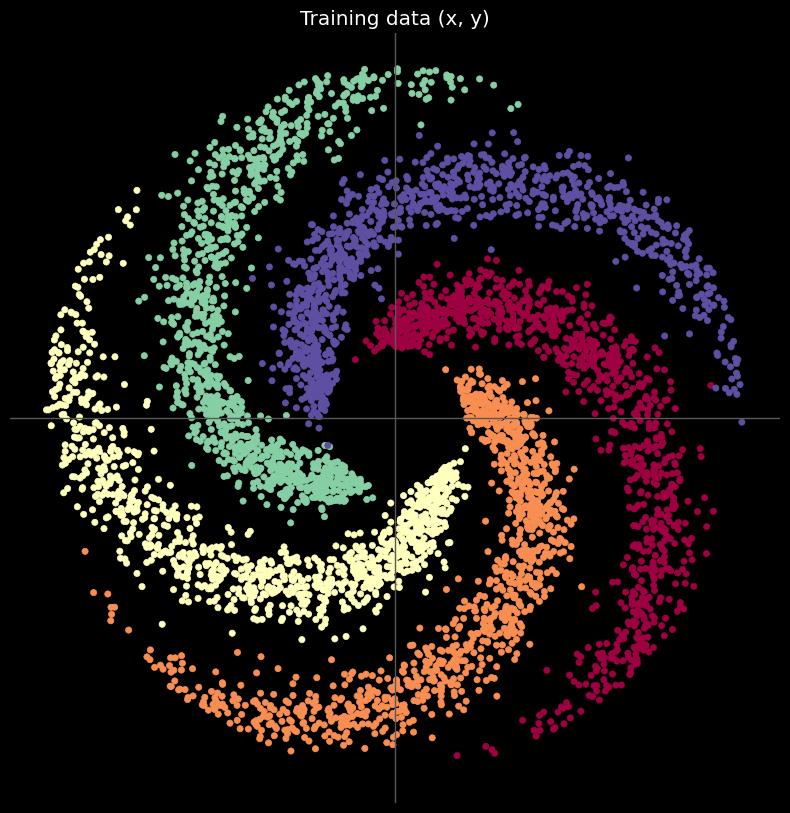

In [ ]:
# And visualise them
plot_data(X, y)

## Build and train a neural net

In [ ]:
learning_rate = 1e-2
lambda_l2 = 1e-5

We replace the last $d*k$ linear layer with a lower-rank `nn.Linear(d, r), nn.Linear(r, K)` linear layer.
This restrict the matrix rank to be lesser or equal to $r$. We observe how this reduced number of parameter affects training accuracy and model behavior.

In [ ]:
class Abs(nn.Module):
    def forward(self, x):
        return torch.abs(x)

# Model definition
model = nn.Sequential(
    nn.Linear(n, d),
    nn.ReLU(),
    # Abs(),

    # nn.Linear(d, K)
    # nn.Linear(d, 2), nn.Linear(2, K)
    nn.Linear(d, 1), nn.Linear(1, K)
)
model.to(device)  # possibly send to CUDA

# Cross entropy given the linear output
C = nn.CrossEntropyLoss(reduction='none')

# Using Adam optimiser
optimiser = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=lambda_l2) # built-in L2

# Full-batch training loop
for t in range(2000):

    # Feed forward to get the linear sum s
    s = model(X)

    # Compute the free energy F and loss L
    F = C(s, y)
    L = F.mean()

    # Zero the gradients
    optimiser.zero_grad()

    # Backward pass to compute and accumulate the gradient
    # of the free energy w.r.t our learnable params
    L.backward()

    # Update params
    optimiser.step()

    # Display epoch, L, and accuracy
    # overwrite(f'[EPOCH]: {t}, [LOSS]: {L.item():.6f}, [ACCURACY]: {acc(s, y):.3f}')
    print(f'[EPOCH]: {t}, [LOSS]: {L.item():.6f}, [ACCURACY]: {acc(s, y):.3f}')

[EPOCH]: 0, [LOSS]: 1.730652, [ACCURACY]: 0.200
[EPOCH]: 1, [LOSS]: 1.689035, [ACCURACY]: 0.200
[EPOCH]: 2, [LOSS]: 1.652656, [ACCURACY]: 0.200
[EPOCH]: 3, [LOSS]: 1.620160, [ACCURACY]: 0.136
[EPOCH]: 4, [LOSS]: 1.591062, [ACCURACY]: 0.134
[EPOCH]: 5, [LOSS]: 1.564949, [ACCURACY]: 0.177
[EPOCH]: 6, [LOSS]: 1.541440, [ACCURACY]: 0.211
[EPOCH]: 7, [LOSS]: 1.520121, [ACCURACY]: 0.225
[EPOCH]: 8, [LOSS]: 1.500553, [ACCURACY]: 0.235
[EPOCH]: 9, [LOSS]: 1.482325, [ACCURACY]: 0.241
[EPOCH]: 10, [LOSS]: 1.465190, [ACCURACY]: 0.242
[EPOCH]: 11, [LOSS]: 1.449122, [ACCURACY]: 0.241
[EPOCH]: 12, [LOSS]: 1.434286, [ACCURACY]: 0.241
[EPOCH]: 13, [LOSS]: 1.420932, [ACCURACY]: 0.240
[EPOCH]: 14, [LOSS]: 1.409169, [ACCURACY]: 0.243
[EPOCH]: 15, [LOSS]: 1.398857, [ACCURACY]: 0.239
[EPOCH]: 16, [LOSS]: 1.389577, [ACCURACY]: 0.230
[EPOCH]: 17, [LOSS]: 1.380755, [ACCURACY]: 0.225
[EPOCH]: 18, [LOSS]: 1.371885, [ACCURACY]: 0.220
[EPOCH]: 19, [LOSS]: 1.362722, [ACCURACY]: 0.215
[EPOCH]: 20, [LOSS]: 1.353283,

performance:

original matrix accuracy: 0.992

rank two matrix accuracy: 0.995

rank one matrix accuracy: 0.971

In [ ]:
def plot_model(X, y, model):
    model.cpu()
    mesh = torch.arange(-1.1, 1.11, 0.01)
    xx, yy = torch.meshgrid(mesh, mesh, indexing='xy')
    with torch.no_grad():
        data = torch.stack((xx.reshape(-1), yy.reshape(-1)), dim=1)
        Z = model(data)
    Z = Z.argmax(dim=1).reshape(xx.shape)
    plt.contourf(xx.numpy(), yy.numpy(), Z, cmap=plt.cm.Spectral, alpha=0.3)
    plot_data(X, y)
    plt.title('Model decision boundaries')

Sequential(
  (0): Linear(in_features=2, out_features=100, bias=True)
  (1): ReLU()
  (2): Linear(in_features=100, out_features=1, bias=True)
  (3): Linear(in_features=1, out_features=5, bias=True)
)


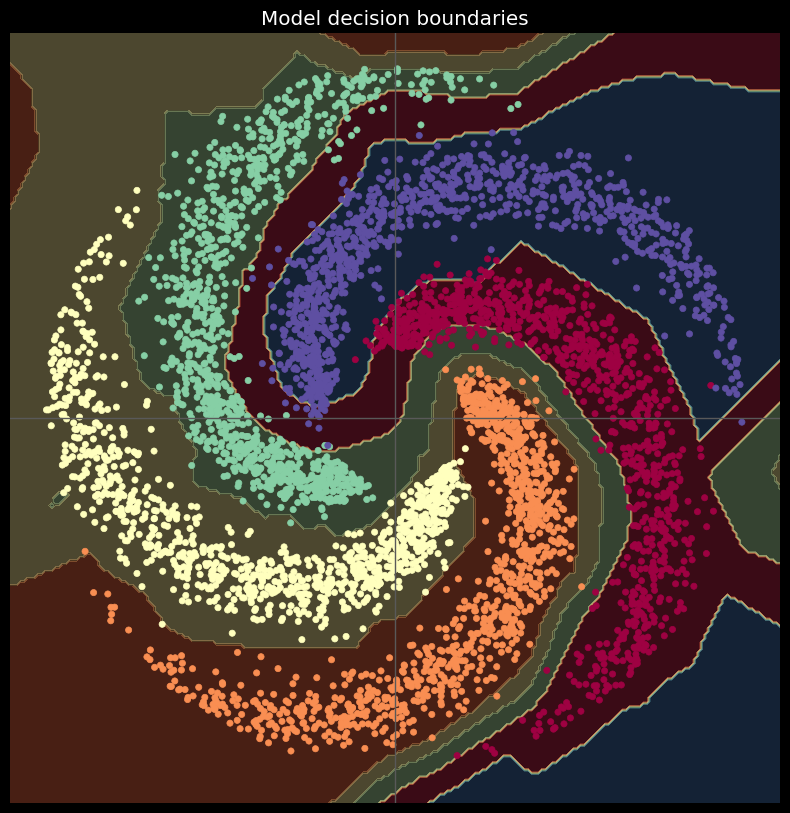

In [ ]:
# Plot trained model
print(model)
plot_model(X, y, model)

we modify the `plot_embeddings` function so that it plots 1D embeddings when the model uses a rank-1 middle layer, using the same logic as rank-2 middle layer plotting.

In [ ]:
def plot_embeddings(X, y, model, zoom=10):
    layer_outputs = {}

    def get_layer_outputs(name):
        def hook(model, input, output):
            layer_outputs[name] = output
        return hook

    layer = model[-2]

    if isinstance(layer, torch.nn.Linear):
        out_dim = layer.out_features
        layer.register_forward_hook(get_layer_outputs("low_dim_embeddings"))

        with torch.no_grad():
            model(X)

        emb = layer_outputs["low_dim_embeddings"].detach().cpu()
        y = y.detach().cpu()
        if out_dim == 1:

            emb = emb.squeeze()
            last_layer = model[-1]
            num_classes = last_layer.weight.shape[0]

            # Build x-grid
            xmin, xmax = emb.min().item(), emb.max().item()
            pad = 0.1 * (xmax - xmin) if xmax > xmin else 1.0
            x_grid = np.linspace(xmin - pad, xmax + pad, 2000)
            x_tensor = torch.from_numpy(x_grid).float().unsqueeze(1)

            # Forward through last (linear) layer
            with torch.no_grad():
                preds_grid = last_layer(x_tensor).argmax(dim=1).cpu().numpy()

            # Compute transitions (decision boundaries)
            boundaries = []
            segments = []
            start = 0
            for k in range(1, len(preds_grid)):
                if preds_grid[k] != preds_grid[k - 1]:
                    xb = (x_grid[k] + x_grid[k - 1]) / 2
                    boundaries.append(xb)
                    segments.append((start, k, int(preds_grid[k - 1])))
                    start = k
            segments.append((start, len(preds_grid), int(preds_grid[-1])))

            colors = plt.cm.Spectral(np.linspace(0, 1, num_classes))

            # === Plot 1: Embeddings on a line
            plt.figure(figsize=(6, 2))
            plt.scatter(emb.numpy(), np.zeros_like(emb),
                        c=y.numpy(), cmap=plt.cm.Spectral, s=15)
            plt.title("Low dim embeddings (R¹)")
            plt.xlabel("Embedding dim 1")
            plt.yticks([])
            for s, e, cls in segments:
                plt.axvspan(x_grid[s], x_grid[e - 1],
                            color=colors[cls], alpha=0.15)
            for xb in boundaries:
                plt.axvline(x=xb, color='k', linestyle='--', alpha=0.5)
            plt.show()

            # === Plot 2: Embedding vs. Target
            plt.figure(figsize=(6, 2))
            plt.scatter(emb.numpy(), y.numpy(),
                        c=y.numpy(), cmap=plt.cm.Spectral, s=15)
            plt.title("Low dim embeddings vs target")
            plt.xlabel("Embedding dim 1")
            plt.ylabel("Target")
            for s, e, cls in segments:
                plt.axvspan(x_grid[s], x_grid[e - 1],
                            color=colors[cls], alpha=0.15)
            for xb in boundaries:
                plt.axvline(x=xb, color='k', linestyle='--', alpha=0.5)
            plt.show()

        elif out_dim == 2:
            emb_np = emb.numpy()
            plt.figure(figsize=(6, 6))
            plt.scatter(emb_np[:, 0], emb_np[:, 1], c=y.numpy(),
                        cmap=plt.cm.Spectral, s=15)
            plt.title("Low dim embeddings (R²)")
            plt.xlabel("Embedding dim 1")
            plt.ylabel("Embedding dim 2")

            last_layer = model[-1]
            mesh = torch.arange(-1.1, 1.1, 0.01) * zoom
            xx, yy = torch.meshgrid(mesh, mesh, indexing="ij")
            with torch.no_grad():
                Z = last_layer(torch.stack((xx.reshape(-1), yy.reshape(-1)), 1))
            Z = Z.argmax(dim=1).reshape(xx.shape)

            plt.contourf(xx.numpy(), yy.numpy(), Z,
                         cmap=plt.cm.Spectral, alpha=0.3,
                         levels=int(y.max().item()) + 1)
            plt.show()

        else:
            print(f"Cannot plot: embeddings in R^{out_dim}, only 1D or 2D supported")

    else:
        print(f"Second-last layer is not linear (found {layer})")


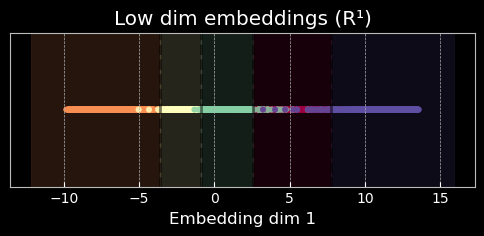

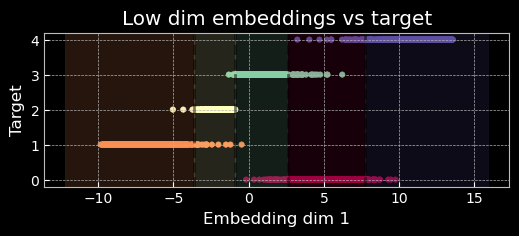

In [ ]:
# (Optional) Plot internal 2D embeddings if available
plot_embeddings(X, y, model, zoom=10)

## Overlapping points

Unlike in the 2d visualization, there are too many overlapping points! To handle this, we can divide the line into small regions and estimate how many points fall in each region, and get a probability density-like figure. The `gaussian_kde` function provides a continuous version of this idea: instead of small regions, it places a small Gaussian around each point and sums them, which gives a smooth estimate of the density of the 1D embedding.

In [ ]:
def plot_embedding_densities(model, X, y):
    with torch.no_grad():
        emb = model[:-1](X).detach().cpu().squeeze()    # shape: (N,)
    y = y.detach().cpu()

    last_layer = model[-1]
    num_classes = last_layer.weight.shape[0]

    xmin, xmax = emb.min().item(), emb.max().item()
    pad = 0.1 * (xmax - xmin) if xmax > xmin else 1.0
    x_grid = np.linspace(xmin - pad, xmax + pad, 2000)
    x_tensor = torch.from_numpy(x_grid).float().unsqueeze(1)

    with torch.no_grad():
        preds_grid = last_layer(x_tensor).argmax(dim=1).cpu().numpy()

    boundaries = []
    segments = []
    start = 0
    for k in range(1, len(preds_grid)):
        if preds_grid[k] != preds_grid[k - 1]:
            xb = (x_grid[k] + x_grid[k - 1]) / 2
            boundaries.append(xb)
            segments.append((start, k, int(preds_grid[k - 1])))
            start = k
    segments.append((start, len(preds_grid), int(preds_grid[-1])))

    colors = plt.cm.Spectral(np.linspace(0, 1, num_classes))

    densities = []
    for i in range(num_classes):
        class_mask = (y == i)
        class_emb = emb[class_mask].numpy()
        if len(class_emb) > 1:
            kde = gaussian_kde(class_emb)
            dens = kde(x_grid)
            dens = dens / dens.max() * 0.9
        else:
            dens = np.zeros_like(x_grid)
        densities.append(dens)

    fig, axes = plt.subplots(num_classes, 1,
                             figsize=(6, 1.6 * num_classes),
                             sharex=True)
    if num_classes == 1:
        axes = [axes]

    for i, ax in enumerate(axes):

        # Decision regions (shaded)
        for s, e, cls in segments:
            ax.axvspan(x_grid[s], x_grid[e - 1],
                       color=colors[cls], alpha=0.15, zorder=1)

        # Decision boundaries
        for xb in boundaries:
            ax.axvline(x=xb, color='k', linestyle='--',
                       alpha=0.4, zorder=2)

        # KDE density curve
        if densities[i].max() > 0:
            ax.fill_between(x_grid, densities[i],
                            color=colors[i], alpha=0.6, zorder=3)
            ax.plot(x_grid, densities[i],
                    color=colors[i], lw=1.0, zorder=4)

        ax.set_yticks([])
        ax.set_ylabel(f"Class {i}")

    axes[-1].set_xlabel("Embedding dim 1")
    fig.suptitle("Low-dim embeddings by class (R¹) — KDE density view", y=1.02)
    plt.tight_layout()
    plt.show()


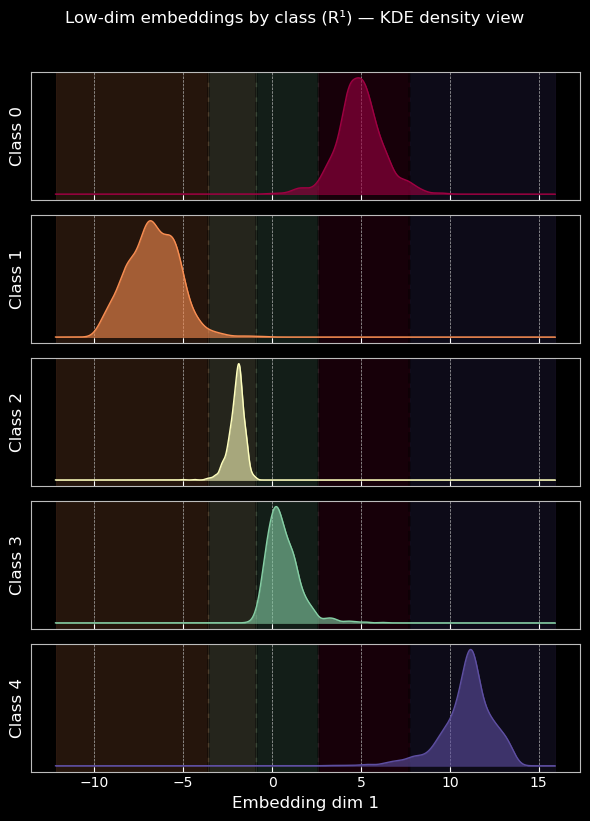

In [ ]:
plot_embedding_densities(model, X, y)

Most of the density falls with in its corresponding shaded region, which justifies the accuracy.

The pair of layers ` nn.Linear(d, r), nn.Linear(r, K)` is a rank-r factorization of the original weight matrix.

We are effectively constraining the last layer $W = AB, A \in R^{d \times r}, B \in R^{r \times k}$.
This forces the network to compress all class-relevant information into a $r$-dimensional subspace of the embedding.

We visualize the change of the 1-dim representation during training.


In [ ]:
from matplotlib.animation import FuncAnimation
from scipy.stats import gaussian_kde
import matplotlib.pyplot as plt
import numpy as np
import torch

def animate_embedding_collapse(
    snapshots,
    y,
    num_classes,
    boundaries=None,
    interval=100
):
    y = y.cpu().numpy()
    colors = plt.cm.Spectral(np.linspace(0, 1, num_classes))

    xmin = min(emb.min() for _, emb, _ in snapshots)
    xmax = max(emb.max() for _, emb, _ in snapshots)
    x_grid = np.linspace(xmin, xmax, 2000)

    fig, axes = plt.subplots(
        num_classes, 1,
        figsize=(6, 1.5 * num_classes),
        sharex=True
    )

    if num_classes == 1:
        axes = [axes]

    lines = []
    fills = []

    for i, ax in enumerate(axes):
        line, = ax.plot([], [], color=colors[i], lw=1.5)
        fill = ax.fill_between([], [], color=colors[i], alpha=0.4)
        ax.set_yticks([])
        ax.set_ylabel(f"Class {i}")

        if boundaries is not None:
            for b in boundaries:
                ax.axvline(b, color="k", linestyle="--", alpha=0.3)

        lines.append(line)
        fills.append(fill)

    axes[-1].set_xlabel("Embedding dim 1")
    acc_text = fig.text(0.75, 0.92, "")

    def update(frame):
        epoch, emb, acc = snapshots[frame]
        fig.suptitle(f"Neural collapse — epoch {epoch}")
        acc_text.set_text(f"Accuracy: {acc:.3f}")

        for i, ax in enumerate(axes):
            fills[i].remove()

            class_emb = emb[y == i]
            if len(class_emb) > 1:
                kde = gaussian_kde(class_emb)
                dens = kde(x_grid)
                dens /= dens.max() + 1e-8
                dens *= 0.9

                lines[i].set_data(x_grid, dens)
                fills[i] = ax.fill_between(
                    x_grid, dens, color=colors[i], alpha=0.4
                )
            else:
                lines[i].set_data([], [])

        return lines + fills

    anim = FuncAnimation(
        fig,
        update,
        frames=len(snapshots),
        interval=interval,
        blit=False
    )

    return anim


In [ ]:
snapshots = []
model = nn.Sequential(
    nn.Linear(n, d),
    nn.ReLU(),
    nn.Linear(d, 1), nn.Linear(1, K)
)
model.to(device)
C = nn.CrossEntropyLoss(reduction='none')

optimiser = torch.optim.Adam(
    model.parameters(),
    lr=1e-3,
    weight_decay=1e-5
    # weight_decay=0
)

for t in range(50000):
    s = model(X)
    loss = C(s, y).mean()

    optimiser.zero_grad()
    loss.backward()
    optimiser.step()

    if t % 200 == 0:
        with torch.no_grad():
            emb = model[:-1](X).cpu().squeeze().numpy()
            acc_val = (s.argmax(dim=1) == y).float().mean().item()
            snapshots.append((t, emb.copy(), acc_val))


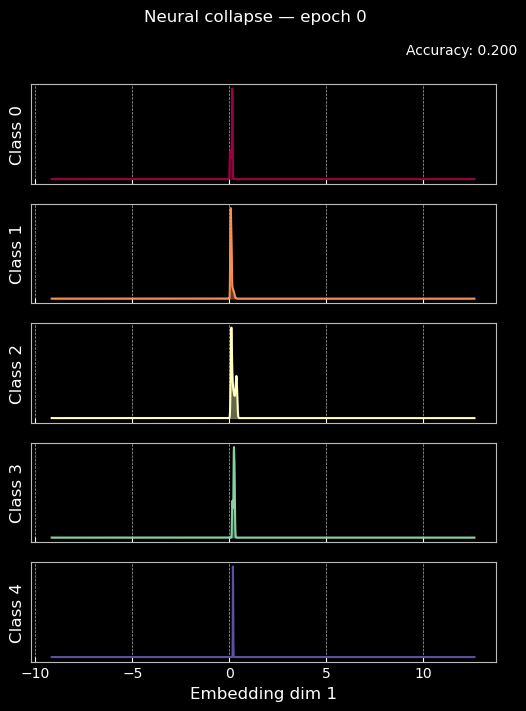

In [ ]:
anim = animate_embedding_collapse(
    snapshots,
    y,
    num_classes=5,
    boundaries=None,
    interval=150
)

from IPython.display import HTML
HTML(anim.to_jshtml())


In [ ]:
anim.save("neural_collapse_lr1e-3.mp4", fps=10)
